## Path configuration

In [1]:
from pathlib import Path
import os

PROJECT_NAME = "MALDIAlign"

cwd = Path().resolve()

# Walk upwards until we find the project folder
target = None
for parent in [cwd] + list(cwd.parents):
    if parent.name == PROJECT_NAME:
        target = parent
        break

# If the project folder is found and we are not already there, then change cwd
if target is not None and target != cwd:
    os.chdir(target)

print("Working directory:", os.getcwd())

Working directory: /export/usuarios01/agnavarr/MALDIAlign


## Imports

In [2]:
import pickle
import numpy as np
import pandas as pd

# utils
from utils.config import load_config
from utils.data import load_pkl, map_domains
from utils.metrics import *
from utils.viz import *

# tools
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC

## Data loading

In [3]:
cfg = load_config()
driams_pkl = cfg["data"]["DRIAMS_REDUCED_PKL"]
marisma_pkl = cfg["data"]["MARISMa_REDUCED_PKL"]

In [4]:
driams = load_pkl(driams_pkl)
marisma = load_pkl(marisma_pkl)

In [6]:
data, label, meta = driams["data"], driams["label"], pd.DataFrame.from_records(list(driams["meta"]))
data_marisma, label_marisma, meta_marisma = marisma["data"], marisma["label"], pd.DataFrame.from_records(list(marisma["meta"]))

In [7]:
meta_marisma = meta_marisma.copy()

meta_marisma.insert(
    loc=0,
    column="hospital",
    value="MARISMA"
)

In [8]:
# Apply normalization: scale each spectrum to [0, 1]
X_min = data.min(axis=1, keepdims=True)
X_max = data.max(axis=1, keepdims=True)
data_norm = (data - X_min) / (X_max - X_min + 1e-8)

In [9]:
# Apply normalization: scale each spectrum to [0, 1]
X_min_marisma = data_marisma.min(axis=1, keepdims=True)
X_max_marisma = data_marisma.max(axis=1, keepdims=True)
data_norm_marisma = (data_marisma - X_min_marisma) / (X_max_marisma - X_min_marisma + 1e-8)

In [10]:
# Filter the data by hospital
filtered_data = {}
for hosp in meta["hospital"].unique():
    idx = np.where(meta["hospital"].values == hosp)[0]
    filtered_data[hosp] = {
        "data": data_norm[idx],
        "label": label[idx],
        "meta": meta.iloc[idx]
    }

In [12]:
# Declare the datasets
dataA, labelA, metaA = filtered_data["DRIAMS_A"]["data"], filtered_data["DRIAMS_A"]["label"], filtered_data["DRIAMS_A"]["meta"]
dataD, labelD, metaD = filtered_data["DRIAMS_D"]["data"], filtered_data["DRIAMS_D"]["label"], filtered_data["DRIAMS_D"]["meta"]

## Models

In [20]:
data_all = np.vstack([dataA, dataD, data_norm_marisma])
label_all= np.concatenate([labelA, labelD, label_marisma])
meta_all = pd.concat([metaA, metaD, meta_marisma], ignore_index=True)

In [13]:
data_train = np.vstack([dataA, data_norm_marisma])
label_train = np.concatenate([labelA, label_marisma])
meta_train = pd.concat([metaA, meta_marisma], ignore_index=True)
data_test, label_test, meta_test = dataD, labelD, metaD

In [14]:
X_train, X_test, y_train, y_test = train_test_split(
    data_train,
    label_train,
    test_size=0.2,
    stratify=label_train,
    shuffle=True,
    random_state=42
)

### RF

#### Train

In [15]:
rf_final = RandomForestClassifier(
    n_estimators=200,
    max_depth=20,
    class_weight="balanced_subsample",
    n_jobs=-1,
    random_state=42
    )
rf_final.fit(X_train, y_train)


,n_estimators,200
,criterion,'gini'
,max_depth,20
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


#### Test

In [16]:
metrics_test = metrics_report(X_test, y_test, rf_final, "DRIAMS A + MARISMA")
metricsD = metrics_report(dataD, labelD, rf_final, "DRIAMS-D")


===== Metrics =====
Domain: DRIAMS A + MARISMA
Balanced Accuracy: 0.9966
F1 Macro: 0.9971
Recall Macro: 0.9966
Specificity Macro: 0.9996



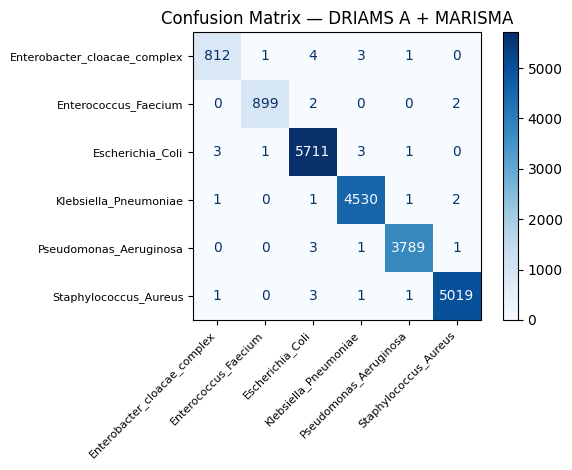

In [17]:
print_metrics(metrics_test)


===== Metrics =====
Domain: DRIAMS-D
Balanced Accuracy: 0.9195
F1 Macro: 0.9076
Recall Macro: 0.9195
Specificity Macro: 0.9818



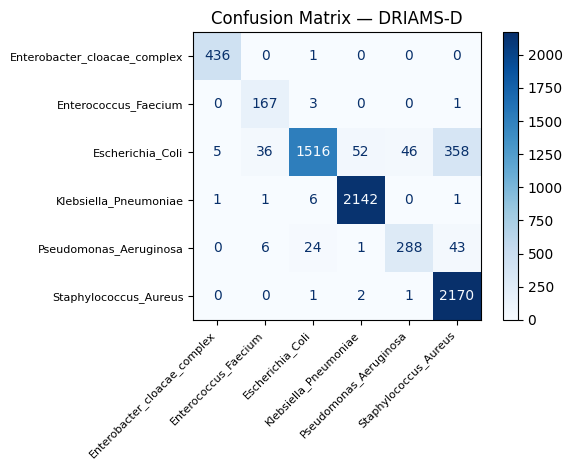

In [18]:
print_metrics(metricsD)

Predict on test

In [19]:
y_pred_A = rf_final.predict(X_test)
y_pred_D = rf_final.predict(dataD)

idx_A = np.where(y_pred_A != y_test)[0]
idx_D = np.where(y_pred_D != labelD)[0]

idx_A_global = np.where(meta["hospital"] == "DRIAMS_A")[0]
idx_D_global = np.where(meta["hospital"] == "DRIAMS_D")[0]

mis_idx_A_global = idx_A_global[idx_A]
mis_idx_D_global = idx_D_global[idx_D]

mis_idx_all_global = np.concatenate([
    mis_idx_A_global,
    mis_idx_D_global
])

#### t-SNEs

In [23]:
X_all_pca = PCA(n_components=50).fit_transform(data_all)

In [25]:
tsne_df = compute_tsne_df(X_all_pca, label_all, meta_all)

##### Global


===== t-SNE: Global (colored by species) =====


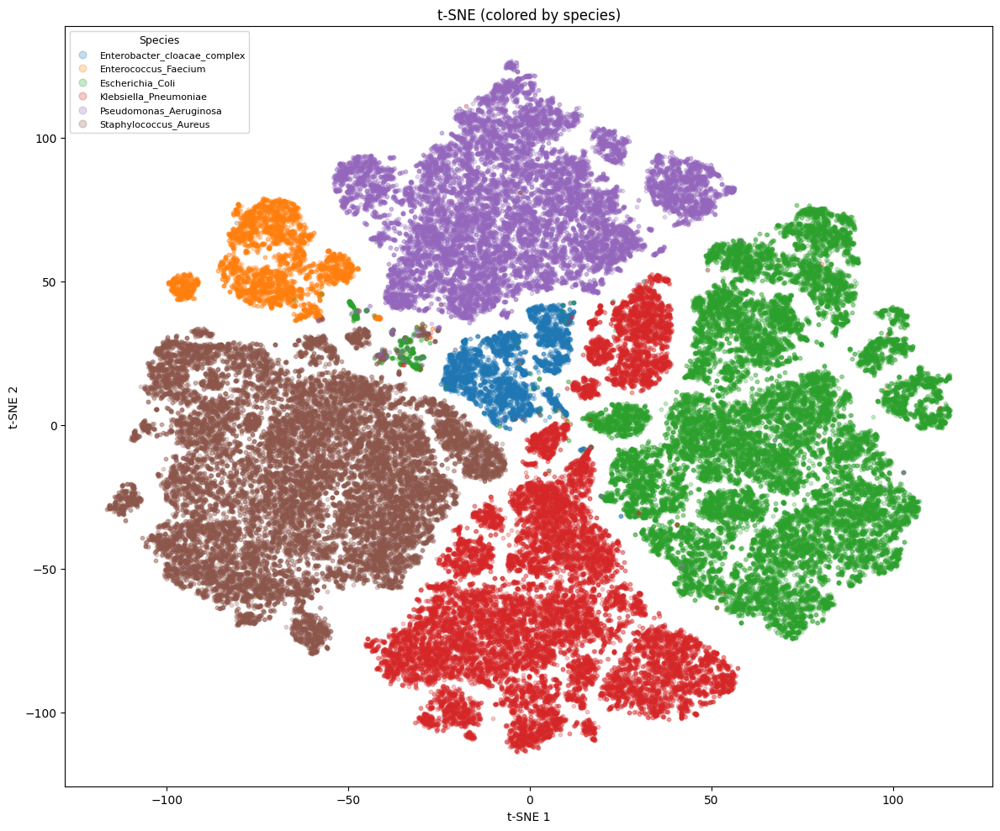


===== t-SNE: Global (colored by species) + misclassified points =====


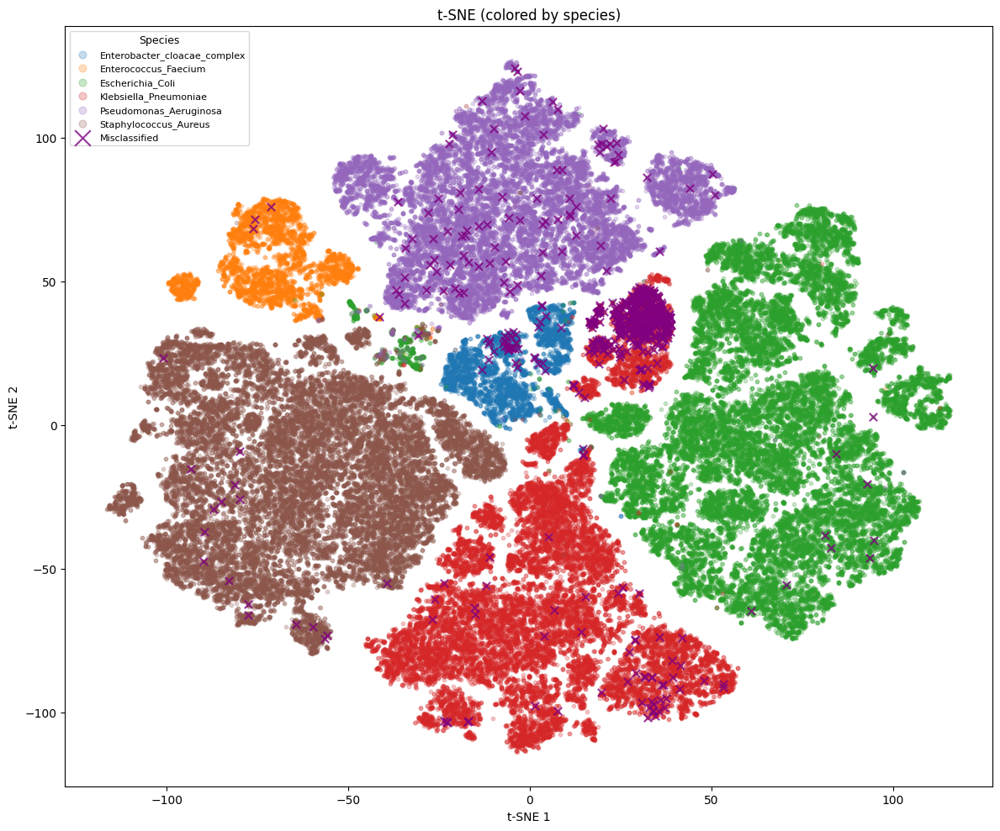


===== t-SNE: Per-species (colored by hospital) =====


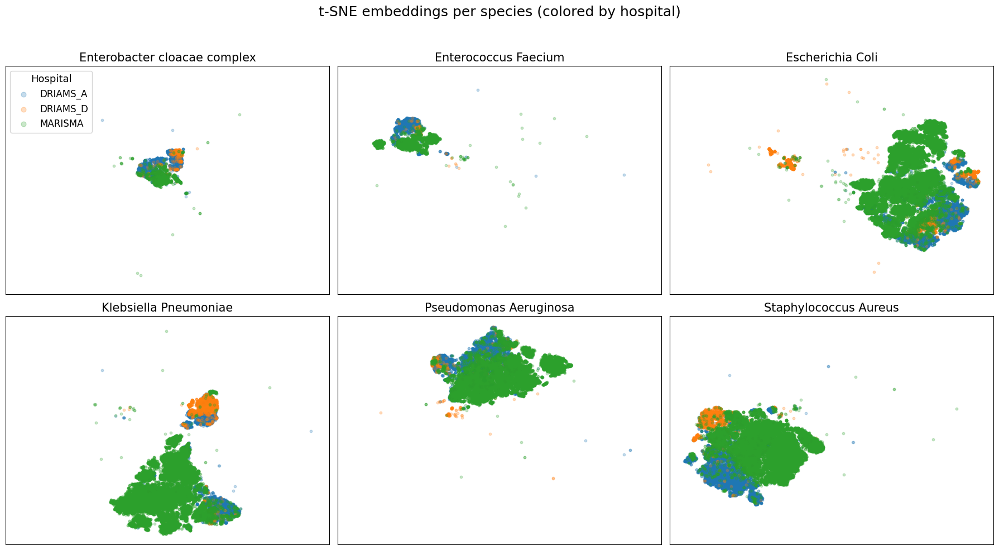


===== t-SNE: Per-species (colored by hospital) + misclassified points =====


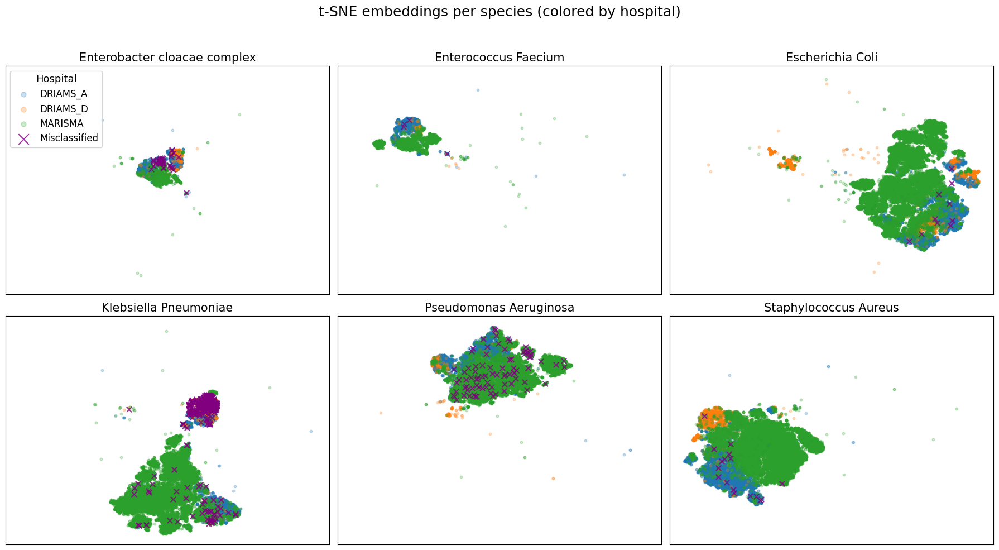


===== t-SNE: Per-species (overlay per hospital) + misclassified points =====


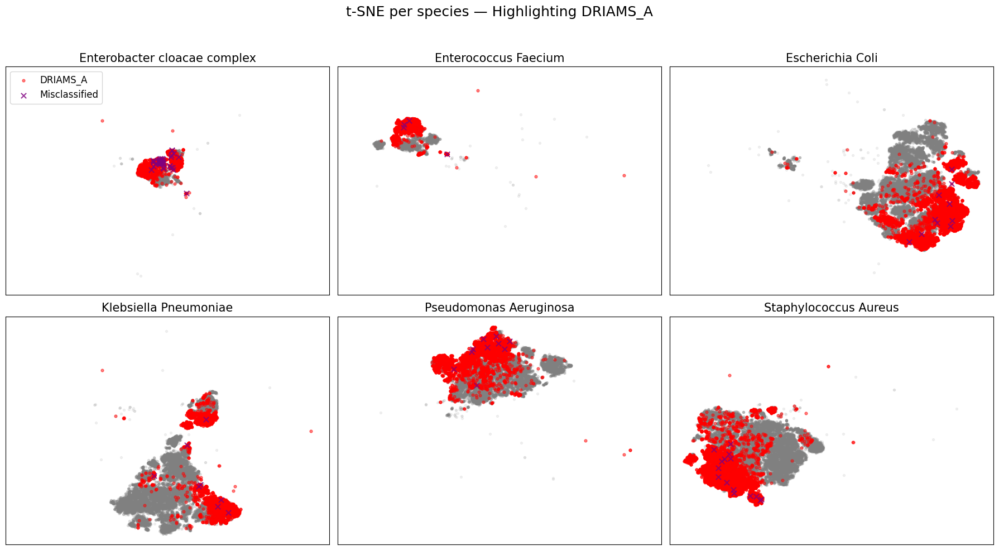

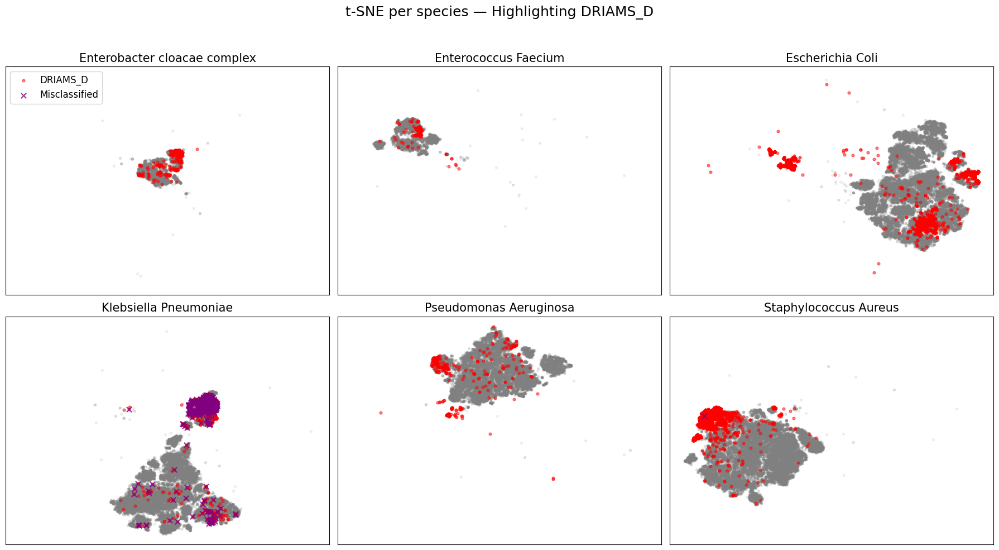

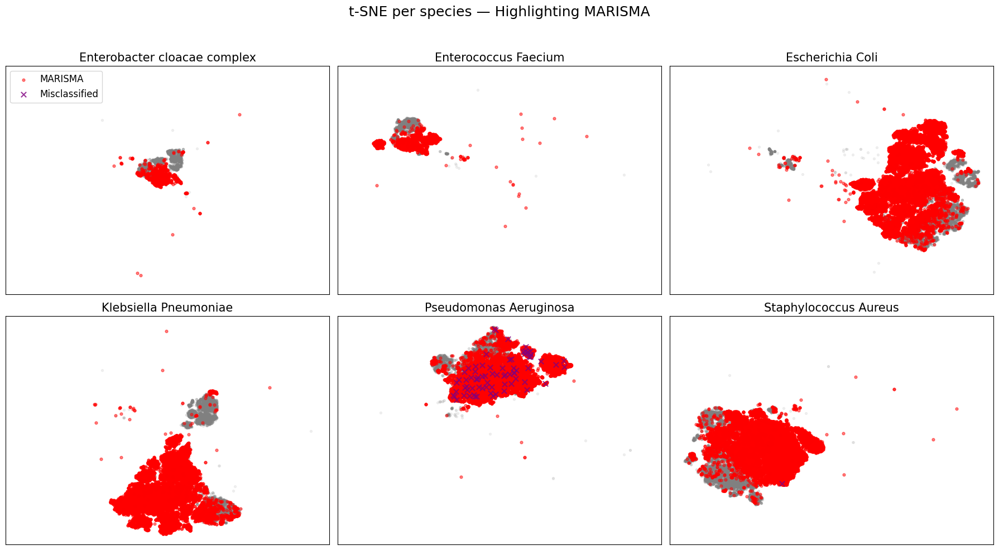


===== t-SNE: Per-species (overlay per year) =====


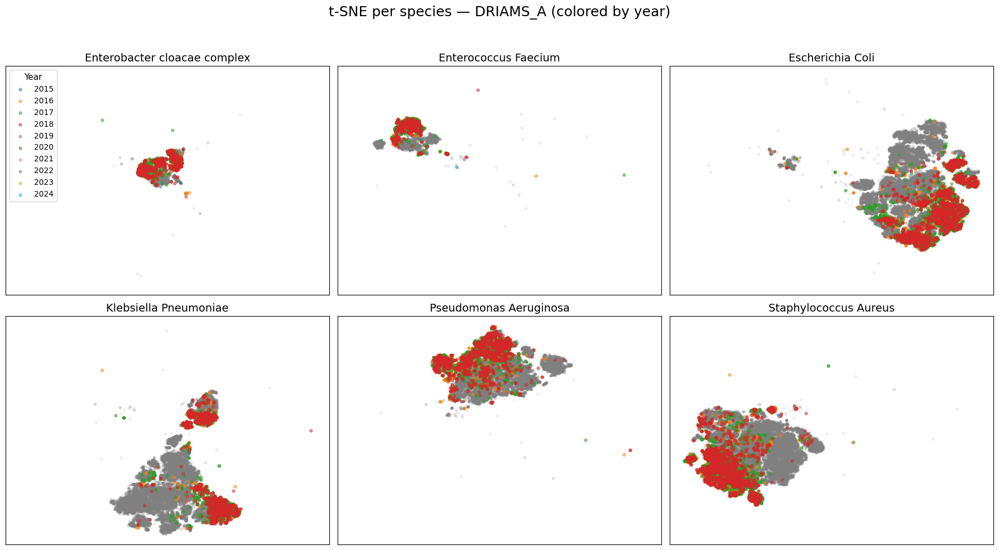

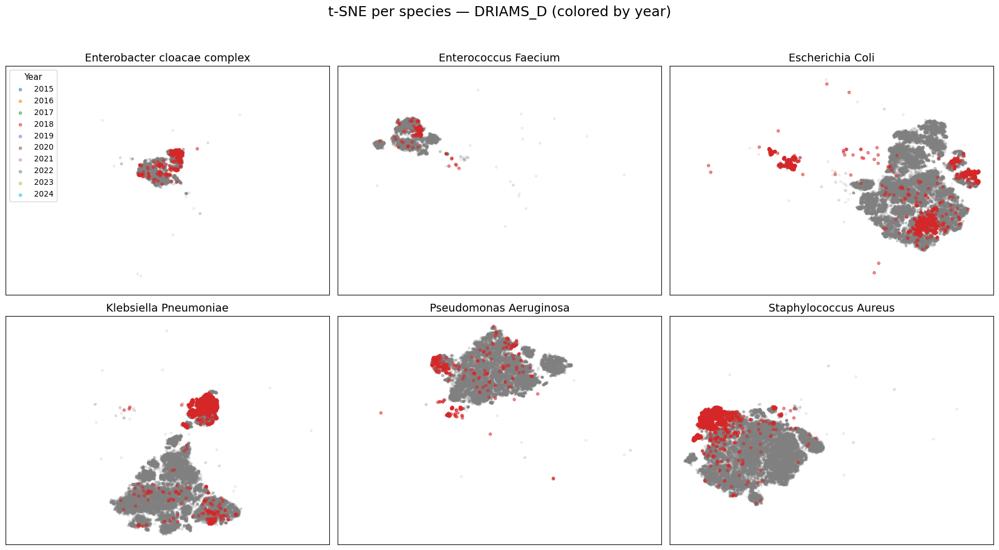

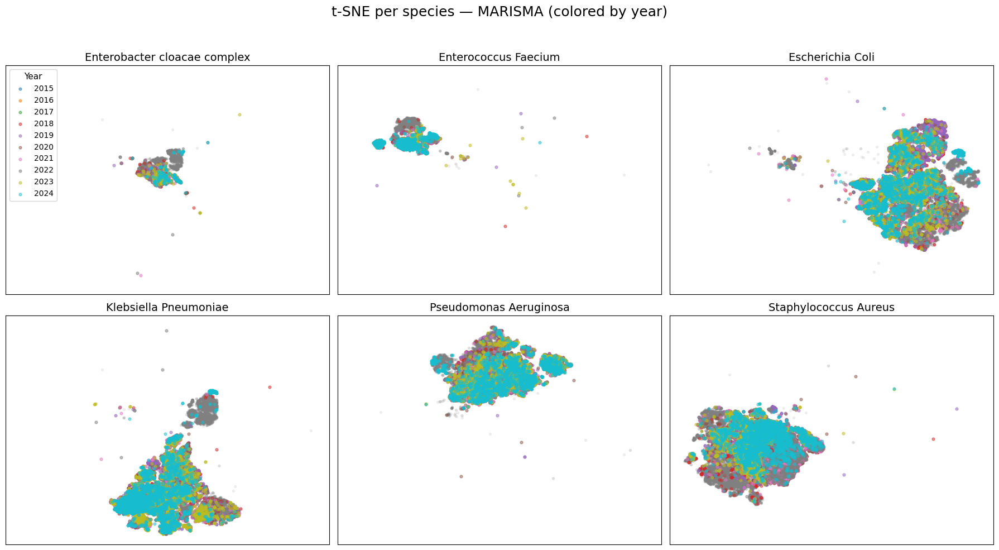


===== t-SNE: Per-species (overlay per year) + misclassified points =====


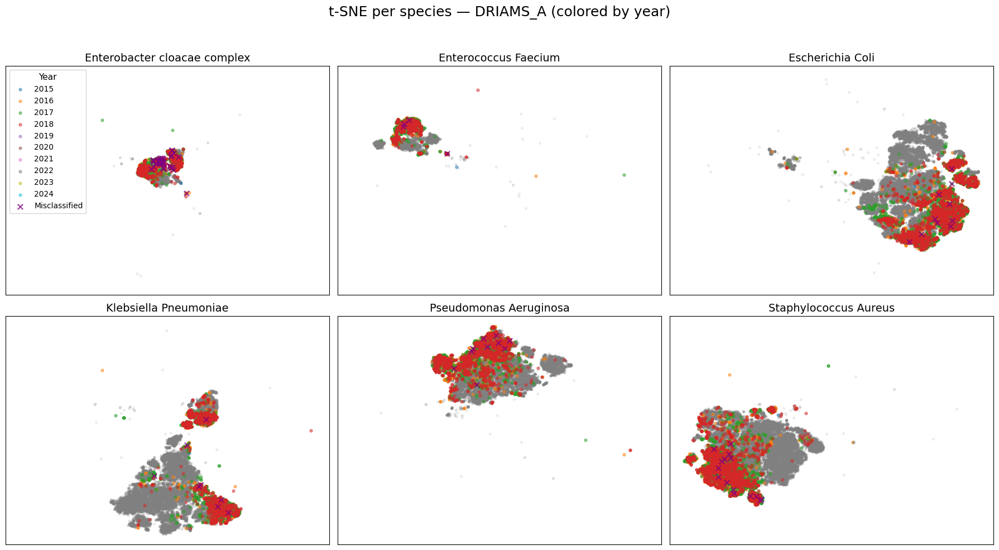

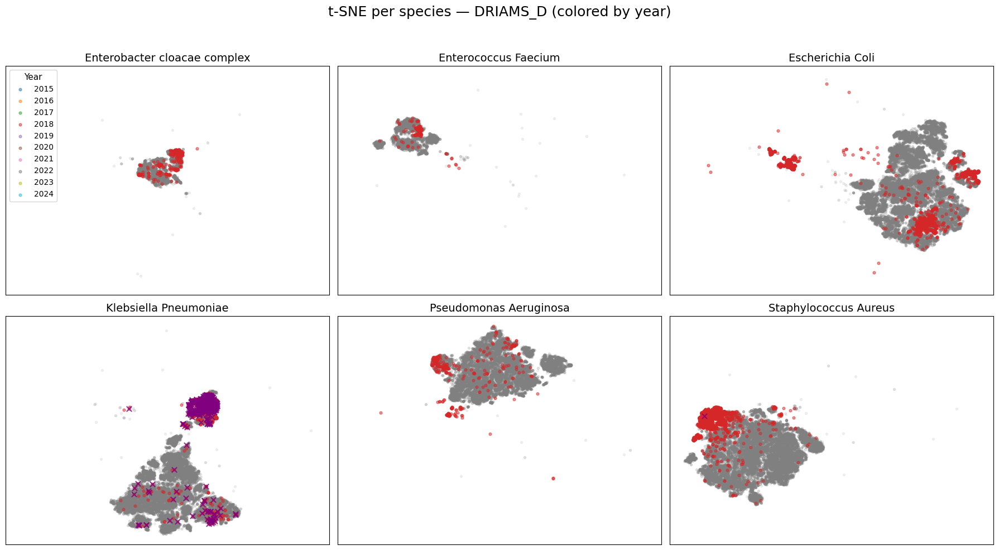

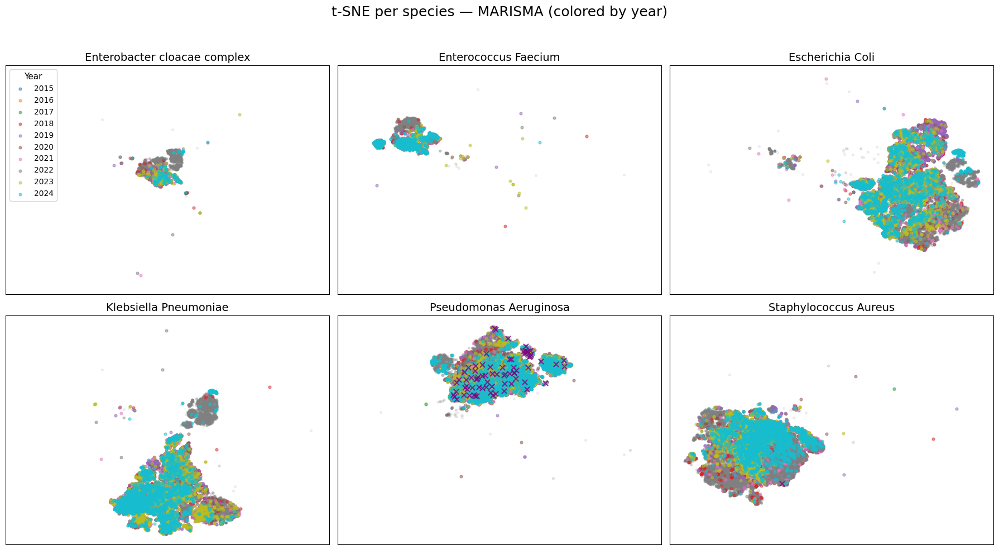

In [26]:
print("\n===== t-SNE: Global (colored by species) =====")
plot_tsne_global(tsne_df, per_species=False)

print("\n===== t-SNE: Global (colored by species) + misclassified points =====")
plot_tsne_global(tsne_df, per_species=False, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (colored by hospital) =====")
plot_tsne_global(tsne_df, per_species=True)

print("\n===== t-SNE: Per-species (colored by hospital) + misclassified points =====")
plot_tsne_global(tsne_df, per_species=True, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (overlay per hospital) + misclassified points =====")
plot_tsne_global(tsne_df, per_species=True, overlay_per_hospital=True, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (overlay per year) =====")
plot_tsne_global(tsne_df, per_species=True, overlay_per_year=True)

print("\n===== t-SNE: Per-species (overlay per year) + misclassified points =====")
plot_tsne_global(tsne_df, per_species=True, overlay_per_year=True, idx=mis_idx_all_global)

##### Per species

In [29]:
df_all, tsne_results = compute_tsne_per_species(X_all_pca, label_all, meta_all, prefix="f")


===== t-SNE (per species): colored by hospital =====


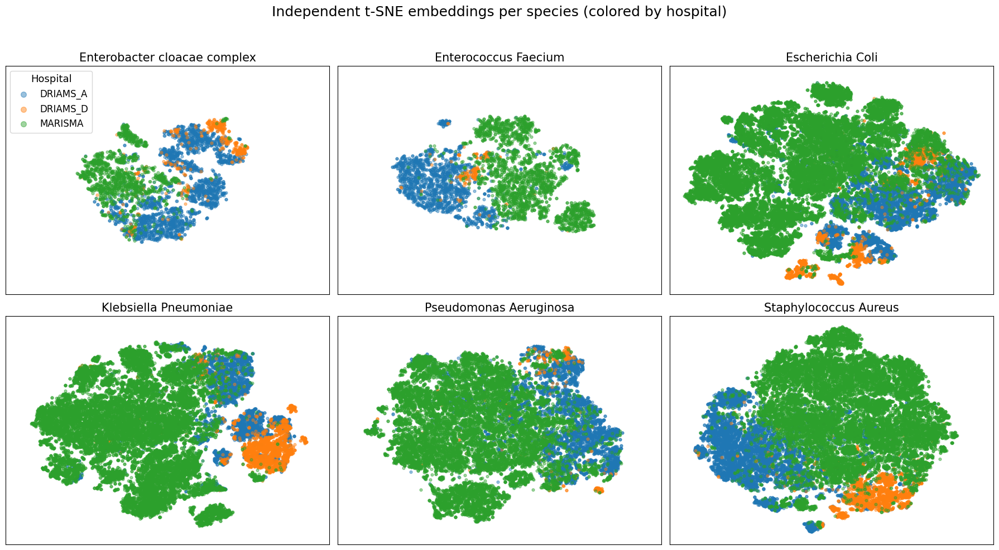


===== t-SNE (per species): colored by hospital + misclassified points =====


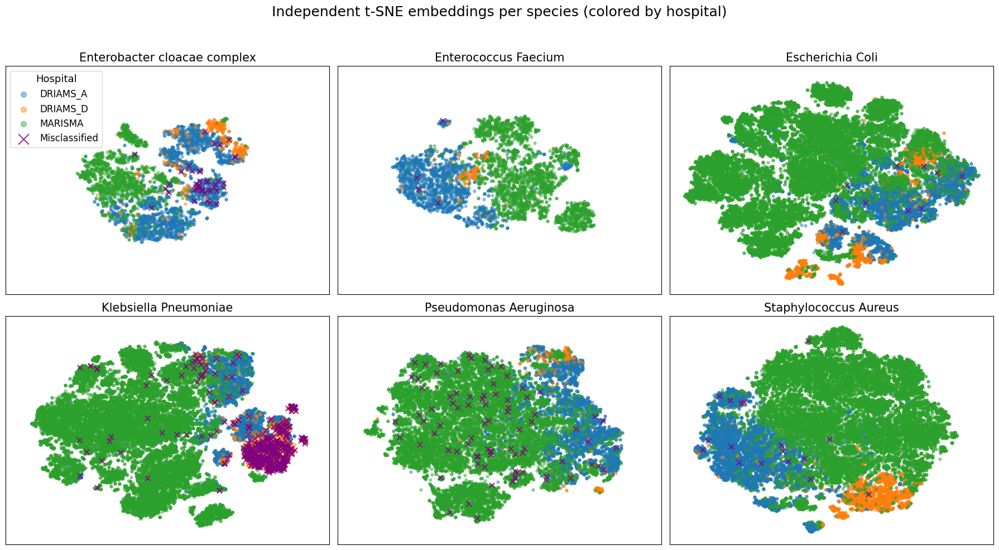


===== t-SNE (per species): overlay per hospital + misclassified points =====


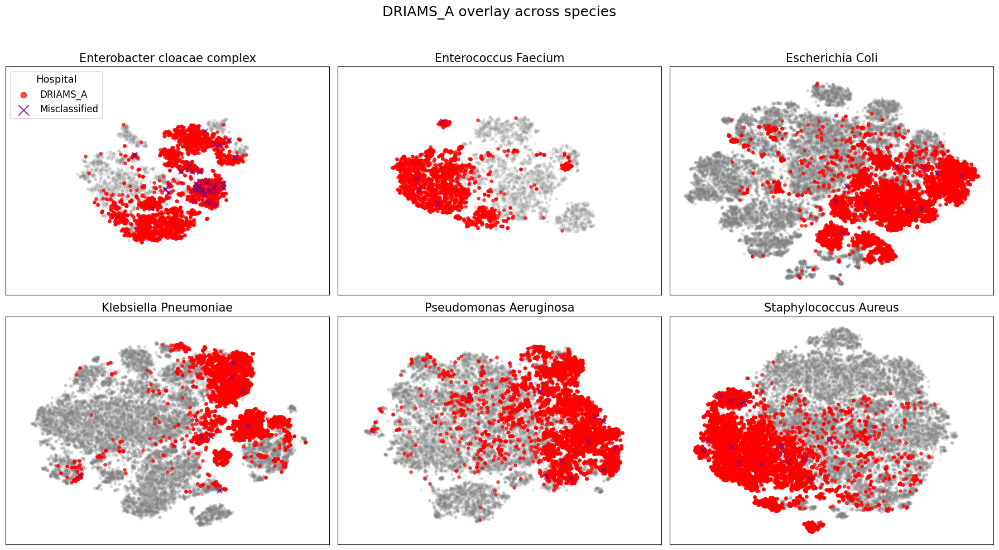

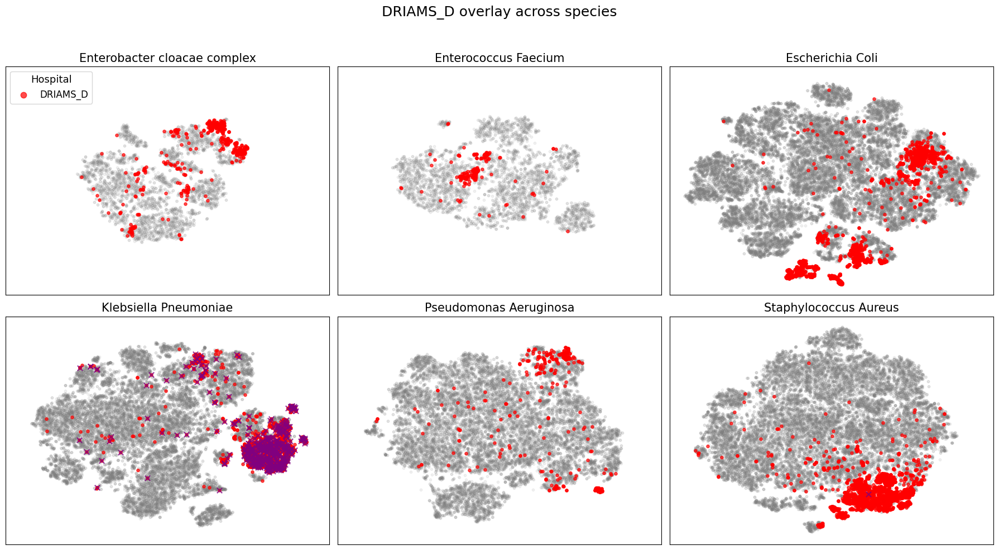

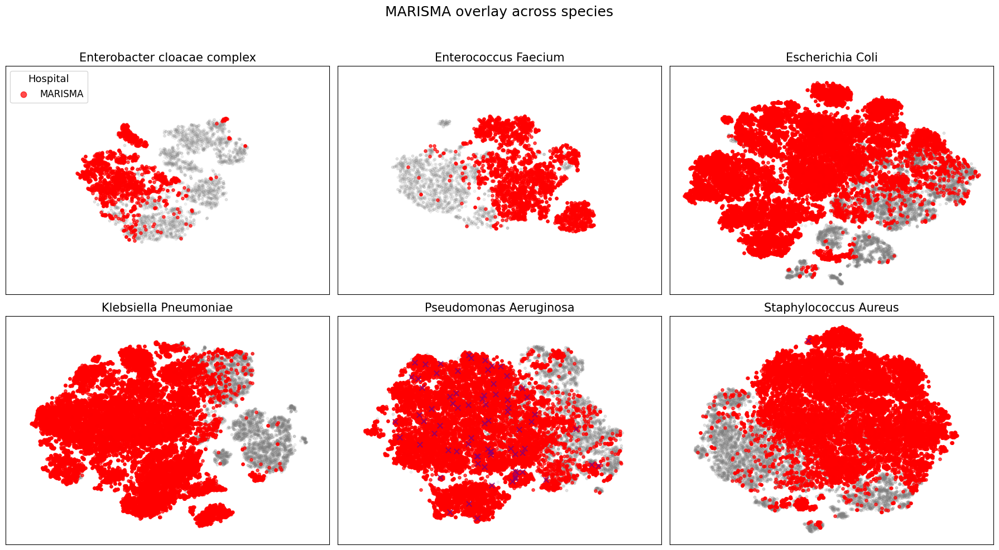


===== t-SNE (per species): overlay per year =====


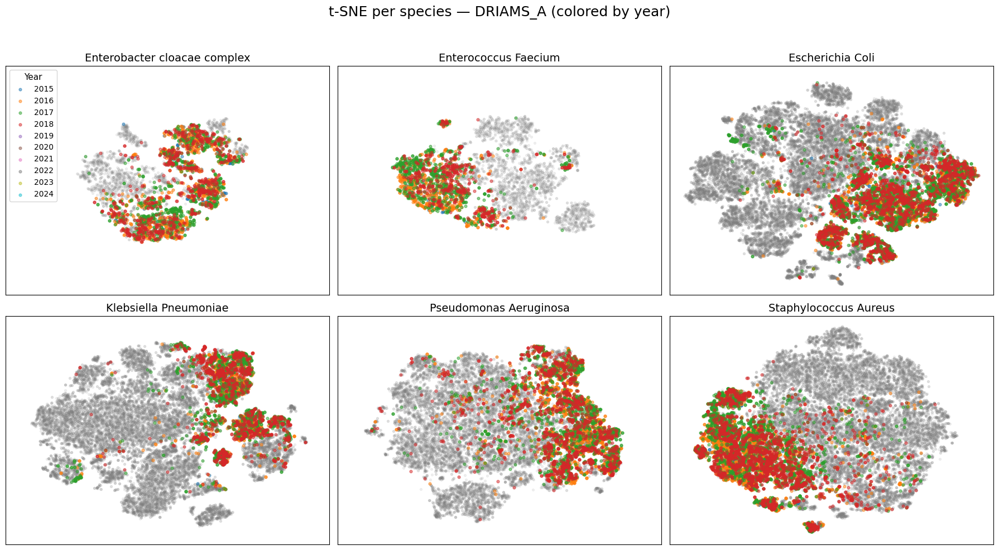

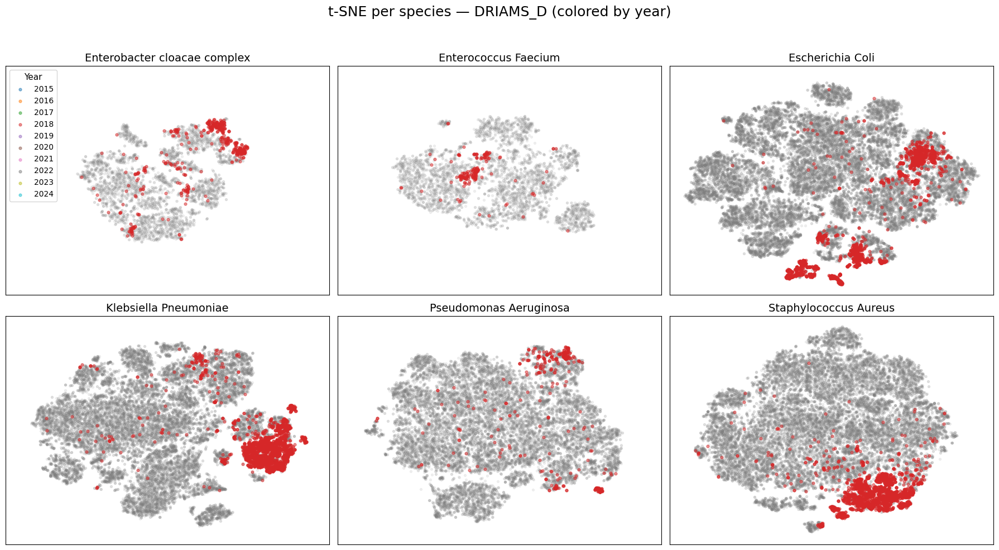

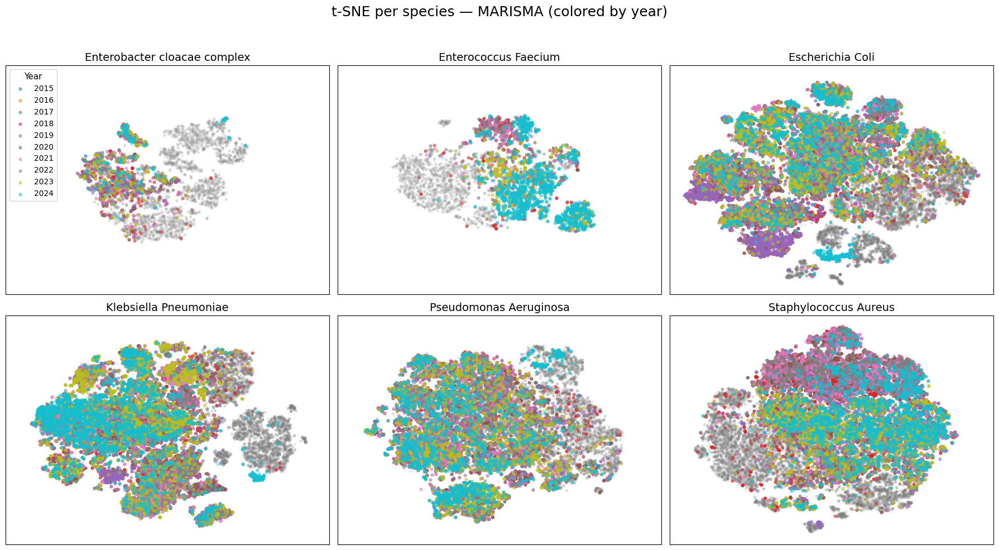


===== t-SNE (per species): overlay per year + misclassified points =====


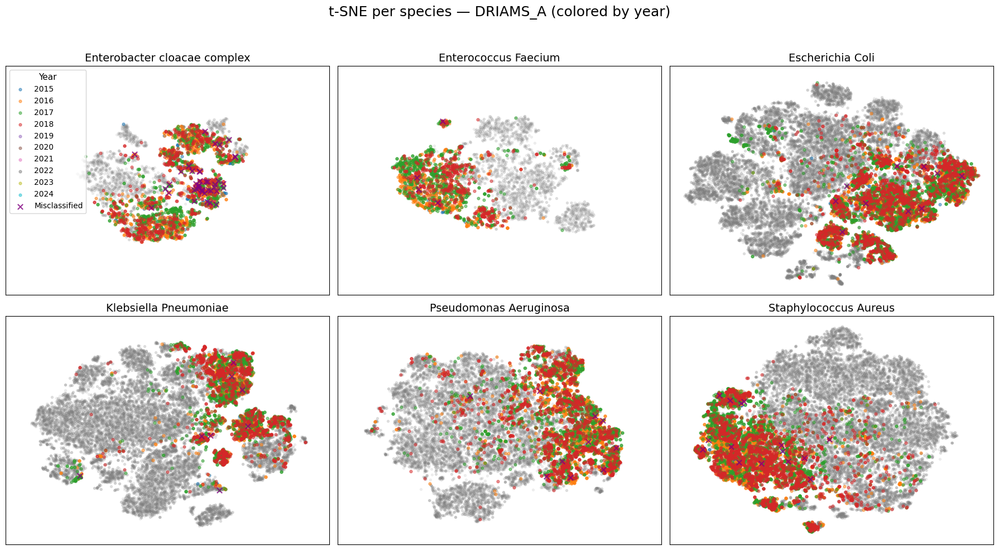

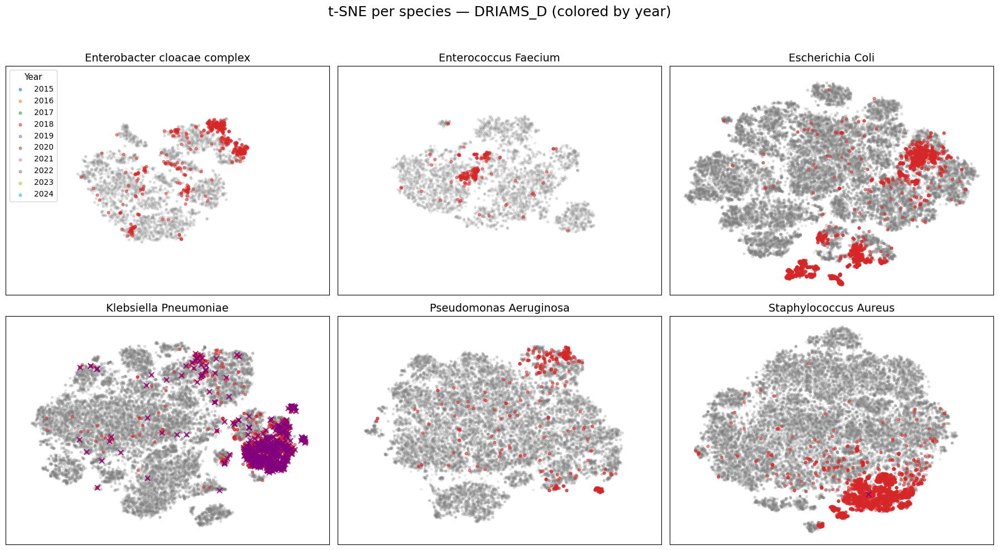

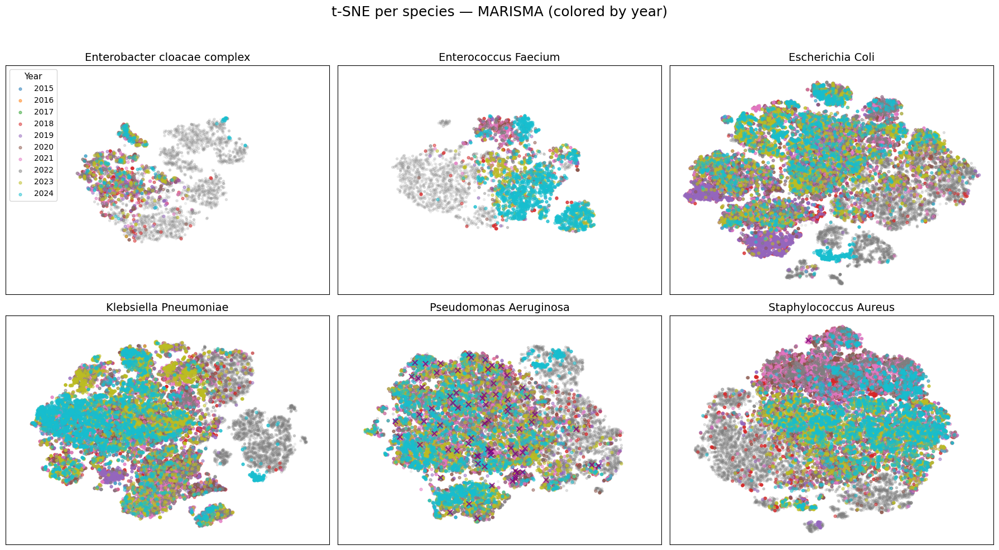

In [30]:
print("\n===== t-SNE (per species): colored by hospital =====")
plot_tsne_species(df_all, tsne_results, idx=None)

print("\n===== t-SNE (per species): colored by hospital + misclassified points =====")
plot_tsne_species(df_all, tsne_results, idx=mis_idx_all_global)

print("\n===== t-SNE (per species): overlay per hospital + misclassified points =====")
plot_tsne_species(df_all, tsne_results, overlay_per_hospital=True, idx=mis_idx_all_global)

print("\n===== t-SNE (per species): overlay per year =====")
plot_tsne_species(df_all, tsne_results, overlay_per_year_per_species=True)

print("\n===== t-SNE (per species): overlay per year + misclassified points =====")
plot_tsne_species(df_all, tsne_results, overlay_per_year_per_species=True, idx=mis_idx_all_global)